In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json


In [6]:
import pandas as pd

# Load the Line Delimited JSON (.ldjson) file directly into a DataFrame
df = pd.read_json(r"D:\AI stylies\fashion_products_data.json", lines=True)

In [7]:
# Display the initial shape and columns
print("Data Shape:", df.shape)
print("Columns:", df.columns)

Data Shape: (30000, 33)
Columns: Index(['uniq_id', 'crawl_timestamp', 'asin', 'product_url', 'product_name',
       'image_urls__small', 'medium', 'large', 'browsenode', 'brand',
       'sales_price', 'weight', 'rating', 'sales_rank_in_parent_category',
       'sales_rank_in_child_category', 'delivery_type', 'meta_keywords',
       'amazon_prime__y_or_n', 'parent___child_category__all',
       'best_seller_tag__y_or_n', 'other_items_customers_buy',
       'product_details__k_v_pairs', 'discount_percentage', 'colour',
       'no__of_reviews', 'seller_name', 'seller_id', 'left_in_stock',
       'no__of_offers', 'no__of_sellers', 'technical_details__k_v_pairs',
       'formats___editions', 'name_of_author_for_books'],
      dtype='object')


In [8]:
# Show the first 5 rows
print(df.head())

# Check data types and non-null count
print(df.info())

# Check for missing values
print(df.isnull().sum())

                            uniq_id            crawl_timestamp        asin  \
0  26d41bdc1495de290bc8e6062d927729  2020-02-07 05:11:36 +0000  B07STS2W9T   
1  410c62298852e68f34c35560f2311e5a  2020-02-07 08:45:56 +0000  B07N6TD2WL   
2  52e31bb31680b0ec73de0d781a23cc0a  2020-02-06 11:09:38 +0000  B07WJ6WPN1   
3  25798d6dc43239c118452d1bee0fb088  2020-02-07 08:32:45 +0000  B07PYSF4WZ   
4  ad8a5a196d515ef09dfdaf082bdc37c4  2020-02-06 14:27:48 +0000  B082KXNM7X   

                                         product_url  \
0  https://www.amazon.in/Facon-Kalamkari-Handbloc...   
1  https://www.amazon.in/Sf-Jeans-Pantaloons-T-Sh...   
2  https://www.amazon.in/LOVISTA-Traditional-Prin...   
3  https://www.amazon.in/People-Printed-Regular-T...   
4  https://www.amazon.in/Monte-Carlo-Cotton-Colla...   

                                        product_name  \
0  LA' Facon Cotton Kalamkari Handblock Saree Blo...   
1  Sf Jeans By Pantaloons Men's Plain Slim fit T-...   
2  LOVISTA Cotton Gota Pat

In [8]:
# Summary statistics for numerical columns
print(df.describe())

         browsenode   sales_price        rating  no__of_reviews  \
count  2.948000e+04  27110.000000  30000.000000     3452.000000   
mean   2.898248e+09    862.172397      4.039857      136.642236   
std    3.050401e+09    964.223008      0.840009      525.484988   
min    1.953148e+09     39.000000      1.000000        1.000000   
25%    1.968067e+09    379.000000      3.500000        4.000000   
50%    1.968135e+09    590.000000      4.000000       15.000000   
75%    1.968444e+09    899.000000      4.900000       72.000000   
max    1.751625e+10   9988.000000      5.000000     9896.000000   

       left_in_stock  no__of_offers  no__of_sellers  
count    3057.000000    1020.000000     1020.000000  
mean        2.091920       6.230392        6.230392  
std         1.317071      16.919507       16.919507  
min         1.000000       1.000000        1.000000  
25%         1.000000       1.000000        1.000000  
50%         2.000000       2.500000        2.500000  
75%         3.0000

In [5]:
# Remove columns not in the specified list
required_columns = ['asin', 'product_url', 'product_name', 'sales_price', 'rating', 'meta_keywords', 'medium', 'brand']
df = df[required_columns]

In [6]:
# Remove rows where all required columns have null values
df.dropna(subset=required_columns, inplace=True)
print("Data Shape after removing rows with null values:", df.shape)

Data Shape after removing rows with null values: (19233, 8)


In [5]:
# Display remaining null values count
print("Remaining Null Values:\n", df.isnull().sum())

Remaining Null Values:
 uniq_id                              0
crawl_timestamp                      0
asin                                 0
product_url                          0
product_name                         0
image_urls__small                    2
medium                               2
large                             1159
browsenode                         520
brand                             8143
sales_price                       2890
weight                               0
rating                               0
sales_rank_in_parent_category     4503
sales_rank_in_child_category      5149
delivery_type                        0
meta_keywords                        0
amazon_prime__y_or_n                 0
parent___child_category__all      4503
best_seller_tag__y_or_n              0
other_items_customers_buy         5637
product_details__k_v_pairs        1183
discount_percentage              15376
colour                           23971
no__of_reviews                   26548
s

In [10]:
# Calculate IQR and remove outliers in 'sales_price'
Q1 = df['sales_price'].quantile(0.25)
Q3 = df['sales_price'].quantile(0.75)
IQR = Q3 - Q1

# Removing outliers beyond 1.5 * IQR
df = df[(df['sales_price'] >= (Q1 - 1.5 * IQR)) & (df['sales_price'] <= (Q3 + 1.5 * IQR))]
print("Data Shape after outlier removal:", df.shape)

Data Shape after outlier removal: (24546, 33)


C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_24452\2019285801.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_price_by_brand.values, y=avg_price_by_brand.index, palette='viridis')


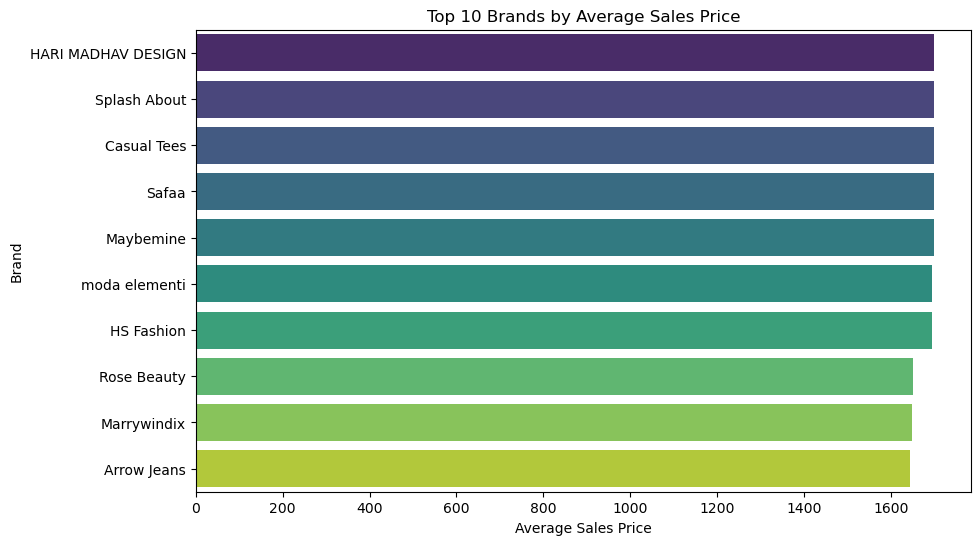

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate average sales price by brand
avg_price_by_brand = df.groupby('brand')['sales_price'].mean().sort_values(ascending=False).head(10)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=avg_price_by_brand.values, y=avg_price_by_brand.index, palette='viridis')
plt.title('Top 10 Brands by Average Sales Price')
plt.xlabel('Average Sales Price')
plt.ylabel('Brand')
plt.show()


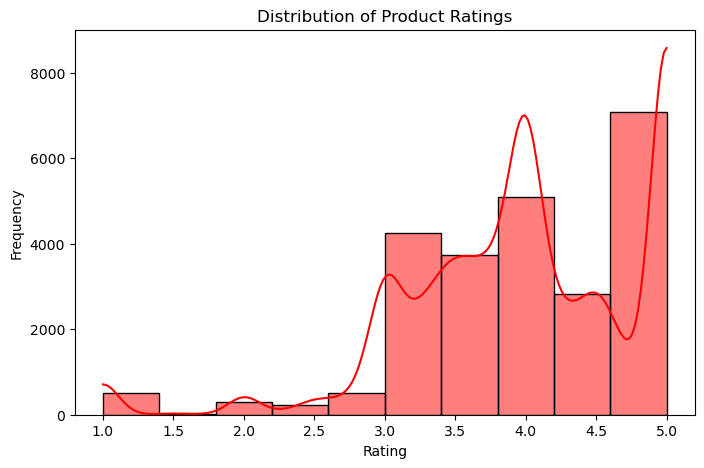

In [11]:
# Plot distribution of ratings
plt.figure(figsize=(8, 5))
sns.histplot(df['rating'], bins=10, kde=True, color='red')
plt.title('Distribution of Product Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()


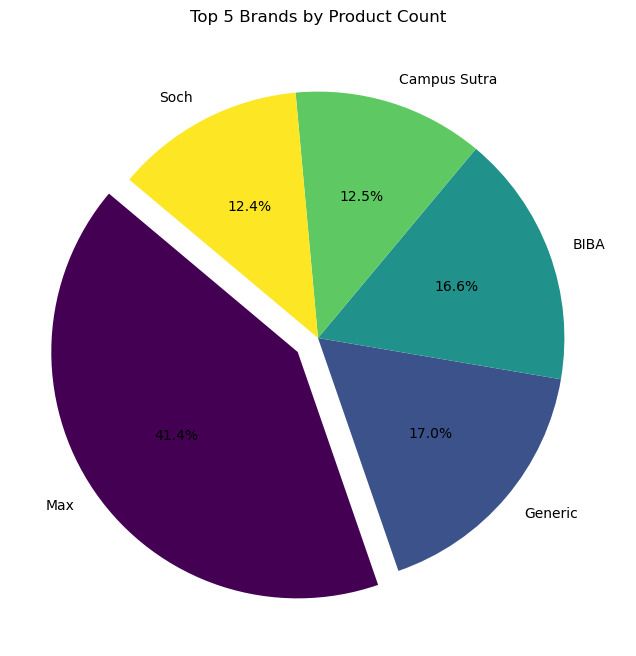

In [12]:
# Get the top 5 brands by product count
top_brands = df['brand'].value_counts().head(5)

# Plot the pie chart
plt.figure(figsize=(8, 8))
top_brands.plot.pie(autopct='%1.1f%%', startangle=140, cmap='viridis', explode=[0.1, 0, 0, 0, 0])

# Add a title
plt.title('Top 5 Brands by Product Count')
plt.ylabel('')  # Remove default ylabel
plt.show()


In [6]:
import pandas as pd
import nltk
from nltk.corpus import stopwords

# Download the stopwords list (only needed once)
nltk.download('stopwords')

# Load the dataset (use your actual dataset path here)
df = pd.read_json(r"D:\AI stylies\fashion_products_data.json", lines=True)

# Check if the 'product_name' column is present
if 'product_name' not in df.columns:
    print("Error: 'product_name' column not found!")
else:
    print("Before removing stopwords:")
    print(df['product_name'].head())

    # Remove stopwords from the 'product_name' column
    stop_words = set(stopwords.words('english'))

    def remove_stopwords(text):
        if isinstance(text, str):  # Ensure the text is a string
            return ' '.join([word for word in text.split() if word.lower() not in stop_words])
        return text

    df['product_name'] = df['product_name'].apply(remove_stopwords)

    print("\nAfter removing stopwords:")
    print(df['product_name'].head())

[nltk_data] Downloading package stopwords to C:\Users\Akshay
[nltk_data]     Chaudhari\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Before removing stopwords:
0    LA' Facon Cotton Kalamkari Handblock Saree Blo...
1    Sf Jeans By Pantaloons Men's Plain Slim fit T-...
2    LOVISTA Cotton Gota Patti Tassel Traditional P...
3             People Men's Printed Regular fit T-Shirt
4    Monte Carlo Grey Solid Cotton Blend Polo Colla...
Name: product_name, dtype: object

After removing stopwords:
0    LA' Facon Cotton Kalamkari Handblock Saree Blo...
1     Sf Jeans Pantaloons Men's Plain Slim fit T-Shirt
2    LOVISTA Cotton Gota Patti Tassel Traditional P...
3             People Men's Printed Regular fit T-Shirt
4    Monte Carlo Grey Solid Cotton Blend Polo Colla...
Name: product_name, dtype: object


In [7]:
import re

# Function to remove special symbols (anything that is not a letter, number, or space)
def remove_special_symbols(text):
    # Replace any non-alphanumeric character (except space) with an empty string
    return re.sub(r'[^A-Za-z0-9\s]', '', text)

# Apply the function to the 'product_name' column
df['product_name'] = df['product_name'].apply(remove_special_symbols)

# Display the first few rows of the cleaned product names
print("\nAfter removing special symbols:")
print(df['product_name'].head())


After removing special symbols:
0    LA Facon Cotton Kalamkari Handblock Saree Blou...
1       Sf Jeans Pantaloons Mens Plain Slim fit TShirt
2    LOVISTA Cotton Gota Patti Tassel Traditional P...
3               People Mens Printed Regular fit TShirt
4    Monte Carlo Grey Solid Cotton Blend Polo Colla...
Name: product_name, dtype: object


In [20]:
import nltk
from nltk.corpus import words

# Download the 'words' corpus if you haven't already
nltk.download('words')

# Create a set of English words
english_words = set(words.words())

# Function to remove non-English words from the product name
def remove_non_english(text):
    return ' '.join([word for word in text.split() if word.lower() in english_words])

# Apply the function to the 'product_name' column
df['product_name'] = df['product_name'].apply(remove_non_english)

# Display the first few rows after removing non-English words
print("\nAfter removing non-English words:")
print(df['product_name'].head())


[nltk_data] Downloading package words to C:\Users\Akshay
[nltk_data]     Chaudhari\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!



After removing non-English words:
0    LA Cotton Blouse Fabric Black Base Cotton
1              Jeans Pantaloons Plain Slim fit
2       Cotton Tassel Traditional Printed Suit
3                   People Printed Regular fit
4    Monte Grey Solid Cotton Blend Polo Collar
Name: product_name, dtype: object


In [21]:
# Dictionary of common abbreviations to full forms
abbreviation_dict = {
    'xl': 'extra large',
    'l': 'large',
    's': 'small',
    'bday': 'birthday',
    'amt': 'amount',
    'ppl': 'people',
    'w/': 'with',
    'w/o': 'without',
    'tbd': 'to be determined',
    'usa': 'united states of america',
    'uk': 'united kingdom',
    'vs': 'versus',
    'info': 'information',
    'app': 'application',
    'qty': 'quantity',
    'pkg': 'package',
    'n/a': 'not applicable'
}

# Function to expand abbreviations
def expand_abbreviations(text):
    words = text.split()
    expanded_words = [abbreviation_dict.get(word.lower(), word) for word in words]
    return ' '.join(expanded_words)

# Apply the function to the 'product_name' column
df['product_name'] = df['product_name'].apply(expand_abbreviations)

# Display the first few rows after expanding abbreviations
print("\nAfter expanding abbreviations:")
print(df['product_name'].head())



After expanding abbreviations:
0    LA Cotton Blouse Fabric Black Base Cotton
1              Jeans Pantaloons Plain Slim fit
2       Cotton Tassel Traditional Printed Suit
3                   People Printed Regular fit
4    Monte Grey Solid Cotton Blend Polo Collar
Name: product_name, dtype: object


In [22]:
import nltk
from nltk.stem import PorterStemmer
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer

# Download required NLTK data files
nltk.download('wordnet')
nltk.download('omw-1.4')

# Initialize stemmer and lemmatizer
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Function for stemming
def apply_stemming(text):
    return ' '.join([stemmer.stem(word) for word in text.split()])

# Function for lemmatization
def apply_lemmatization(text):
    return ' '.join([lemmatizer.lemmatize(word, pos=wordnet.VERB) for word in text.split()])

# Apply stemming and lemmatization to the 'product_name' column
df['product_name_stemmed'] = df['product_name'].apply(apply_stemming)
df['product_name_lemmatized'] = df['product_name'].apply(apply_lemmatization)

# Display the first few rows after stemming and lemmatization
print("\nAfter Stemming:")
print(df[['product_name', 'product_name_stemmed']].head())

print("\nAfter Lemmatization:")
print(df[['product_name', 'product_name_lemmatized']].head())


[nltk_data] Downloading package wordnet to C:\Users\Akshay
[nltk_data]     Chaudhari\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to C:\Users\Akshay
[nltk_data]     Chaudhari\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!



After Stemming:
                                product_name  \
0  LA Cotton Blouse Fabric Black Base Cotton   
1            Jeans Pantaloons Plain Slim fit   
2     Cotton Tassel Traditional Printed Suit   
3                 People Printed Regular fit   
4  Monte Grey Solid Cotton Blend Polo Collar   

                       product_name_stemmed  
0  la cotton blous fabric black base cotton  
1             jean pantaloon plain slim fit  
2           cotton tassel tradit print suit  
3                   peopl print regular fit  
4  mont grey solid cotton blend polo collar  

After Lemmatization:
                                product_name  \
0  LA Cotton Blouse Fabric Black Base Cotton   
1            Jeans Pantaloons Plain Slim fit   
2     Cotton Tassel Traditional Printed Suit   
3                 People Printed Regular fit   
4  Monte Grey Solid Cotton Blend Polo Collar   

                     product_name_lemmatized  
0  LA Cotton Blouse Fabric Black Base Cotton  
1            

In [8]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Initialize the vectorizer
vectorizer = CountVectorizer()

# Fit and transform the product_name column
bow_matrix = vectorizer.fit_transform(df['product_name'])

# Convert sparse matrix to DataFrame
bow_df = pd.DataFrame(bow_matrix.toarray(), columns=vectorizer.get_feature_names_out())

# Check the Bag of Words representation
print(bow_df.head())





   0005  001  0012navymedium  0013blackyellow  0017  001a  001black  0022  \
0     0    0               0                0     0     0         0     0   
1     0    0               0                0     0     0         0     0   
2     0    0               0                0     0     0         0     0   
3     0    0               0                0     0     0         0     0   
4     0    0               0                0     0     0         0     0   

   002brieflt  006a  ...  zoyei  zs  ztlvrpl05black  zumba  zumka  zunahme  \
0           0     0  ...      0   0               0      0      0        0   
1           0     0  ...      0   0               0      0      0        0   
2           0     0  ...      0   0               0      0      0        0   
3           0     0  ...      0   0               0      0      0        0   
4           0     0  ...      0   0               0      0      0        0   

   zupaco  zutano  zx  zysta  
0       0       0   0      0  
1     

In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Combine relevant text features
df['combined_features'] = (
    df['product_name'].fillna('') + " " +
    df['meta_keywords'].fillna('')
)
# Initialize the TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the combined features
tfidf_matrix = tfidf_vectorizer.fit_transform(df['combined_features'])

# Calculate the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

def recommend_clothing(product_name, top_n=5):
    # Find the index of the input product
    idx = df[df['product_name'].str.contains(product_name, case=False, na=False)].index[0]
    
    # Get similarity scores for this product
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort scores in descending order
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get indices of top N similar products (excluding the input product)
    sim_indices = [i[0] for i in sim_scores[1:top_n+1]]
    
    # Return the top N similar products
    return df.iloc[sim_indices][['product_name', 'sales_price', 'rating', 'brand']]

# Example: Recommend products similar to "Casual Shirt"
recommendations = recommend_clothing("Casual Shirt", top_n=5)
print(recommendations)


                                            product_name  sales_price  rating  \
23577    Pepe Jeans Men's Solid Regular fit Casual Shirt        919.0     1.0   
28473    Pepe Jeans Men's Solid Regular fit Casual Shirt        919.0     2.7   
28512  Pepe Jeans Men's Printed Regular Fit Casual Shirt        879.0     3.4   
12885  Pepe Jeans Men's Checkered Regular Fit Casual ...        919.0     4.5   
25680  Pepe Jeans Men's Checkered Regular Fit Casual ...        919.0     4.4   

      brand  
23577   NaN  
28473   NaN  
28512   NaN  
12885   NaN  
25680   NaN  


In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from IPython.display import display, Image

def recommend_products_debug(product_id, df, num_recommendations=5):
    if product_id not in df['asin'].values:
        print("Product ID not found in the dataset.")
        return

    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(df['product_name'])

    nn_model = NearestNeighbors(metric='cosine', algorithm='brute')
    nn_model.fit(tfidf_matrix)

    product_idx = df[df['asin'] == product_id].index[0]
    distances, indices = nn_model.kneighbors(tfidf_matrix[product_idx], n_neighbors=num_recommendations + 1)

    print(f"Indices: {indices}")
    print(f"Distances: {distances}")

    if len(indices[0]) <= 1:
        print("No similar products found.")
        return

    print(f"Recommendations for Product ID: {product_id}")
    for i in range(1, len(indices[0])):
        idx = indices[0][i]
        recommended_product = df.iloc[idx]

        print(f"Product {i}:")
        print(f"Name: {recommended_product['product_name']}")
        print(f"Brand: {recommended_product['brand']}")
        print(f"Rating: {recommended_product['rating']}")
        print(f"Price: {recommended_product['sales_price']}")
        print(f"URL: {recommended_product['product_url']}")
        display(Image(url=recommended_product['product_url']))
        print("\n")

recommend_products_debug(product_id='B07STS2W9T', df=df, num_recommendations=3)


Indices: [[18915     0 10141 19612]]
Distances: [[0.         0.         0.46595457 0.76153945]]
Recommendations for Product ID: B07STS2W9T
Product 1:
Name: LA' Facon Cotton Kalamkari Handblock Saree Blouse Fabric 100 cms Black Base Dancers (Cotton)
Brand: LA' Facon
Rating: 5.0
Price: 200.0
URL: https://www.amazon.in/Facon-Kalamkari-Handblock-Dancers-Lehenga/dp/B07SWVSRPP/




Product 2:
Name: Cotton Kalamkari Handblock Saree Blouse/Kurti Fabric 100 cms Purple Colour - Budda Print
Brand: La' Facon
Rating: 3.0
Price: 200.0
URL: https://www.amazon.in/Cotton-Kalamkari-Handblock-Blouse-Fabric/dp/B07WC455L8/




Product 3:
Name: HANDBLOCK PRINT Women's Rayon Embroidered Anarkali Kurti
Brand: HANDBLOCK PRINT
Rating: 4.2
Price: 543.0
URL: https://www.amazon.in/HANDBLOCK-PRINT-Womens-Embroidered-Anarkali/dp/B07TLXPTBD/


In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from IPython.display import display, Image
import requests
from PIL import Image as PILImage
import os

# Function to validate and display images
def display_image_with_fallback(url, fallback_text="Image not available"):
    try:
        # Validate URL accessibility
        response = requests.get(url, stream=True, timeout=5)
        if response.status_code == 200:
            # Display image
            display(Image(url=url))
        else:
            print(fallback_text)
    except Exception as e:
        print(f"{fallback_text}. Error: {e}")

# Recommendation function with image display
def recommend_products_with_images(product_id, df, num_recommendations=5):
    if product_id not in df['asin'].values:
        print("Product ID not found in the dataset.")
        return

    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(df['product_name'])

    nn_model = NearestNeighbors(metric='cosine', algorithm='brute')
    nn_model.fit(tfidf_matrix)

    # Find the index of the input product
    product_idx = df[df['asin'] == product_id].index[0]
    distances, indices = nn_model.kneighbors(tfidf_matrix[product_idx], n_neighbors=num_recommendations + 1)

    print(f"Recommendations for Product ID: {product_id}")

    for i in range(1, len(indices[0])):  # Skip the first result (it's the input product itself)
        idx = indices[0][i]
        recommended_product = df.iloc[idx]

        print(f"\nProduct {i}:")
        print(f"Name: {recommended_product['product_name']}")
        print(f"Brand: {recommended_product['brand']}")
        print(f"Rating: {recommended_product['rating']}")
        print(f"Price: {recommended_product['sales_price']}")
        print(f"URL: {recommended_product['product_url']}")

        # Display the product image or fallback text
        display_image_with_fallback(recommended_product['product_url'], fallback_text="Image not available")

# Sample dataset filtering for valid URLs
df = df[df['product_url'].notnull()]
df = df[df['product_url'].str.startswith("http")]

# Test the recommendation system
recommend_products_with_images(product_id='B07PYW9RRK', df=df, num_recommendations=3)


Recommendations for Product ID: B07PYW9RRK

Product 1:
Name: Flint Genuine Leather Slim Belt Women
Brand: FLINT
Rating: 4.0
Price: 425.0
URL: https://www.amazon.in/Flint-Genuine-Leather-Slim-Women/dp/B07L5JDDFX/
Image not available

Product 2:
Name: Mens Genuine Leather Brown Formal Belt 100 Pure Genuine Leather Guaranteed Designer Belt Men
Brand: Generic
Rating: 4.3
Price: 599.0
URL: https://www.amazon.in/Genuine-Leather-Formal-Guaranteed-Designer/dp/B06VTLJ5BV/
Image not available

Product 3:
Name: Pelt Mens Genuine Leather Belt
Brand: PELT LEATHER COMPANY
Rating: 5.0
Price: 329.0
URL: https://www.amazon.in/Pelt-Mens-Genuine-Leather-Belt/dp/B07ZS9WRWQ/
Image not available


In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from IPython.display import Image, display

# TF-IDF Recommendation Function
def recommend_tfidf(product_id, num_recommendations, tfidf_matrix, df):
    """
    Generates recommendations using cosine similarity with TF-IDF embeddings.
    """
    # Check if the product_id exists in the dataframe
    if product_id not in df['asin'].values:
        print(f"Product ID {product_id} not found in the dataset.")
        return None
    
    # Get the index of the product_id
    product_index = df.index[df['asin'] == product_id][0]
    
    # Convert tfidf_matrix to dense format (if it is sparse)
    tfidf_matrix_dense = tfidf_matrix.toarray()  # Convert sparse matrix to dense array
    
    # Calculate cosine similarity
    cosine_sim = cosine_similarity([tfidf_matrix_dense[product_index]], tfidf_matrix_dense).flatten()
    
    # Get the indices of the most similar products
    similar_indices = cosine_sim.argsort()[-num_recommendations - 1:-1][::-1]
    
    # Retrieve the recommendations
    recommendations = df.iloc[similar_indices][['asin', 'product_name', 'sales_price', 'rating', 'medium']]
    recommendations['similarity_score'] = cosine_sim[similar_indices]
    
    return recommendations

# Display recommendations for TF-IDF
def display_recommendations_tfidf(recommendations):
    if recommendations is not None and not recommendations.empty:
        print("Displaying TF-IDF Recommendations:")
        for index, row in recommendations.iterrows():
            product_image_url = row['medium']  # Assuming 'medium' column contains the image URLs
            product_name = row['product_name']
            sales_price = row['sales_price']
            
            # Display product image
            display(Image(url=product_image_url, width=200))
            
            # Display product details
            print(f"Product Name: {product_name}")
            print(f"Price: {sales_price}")
            print(f"Rating: {row['rating']}")
            print(f"Similarity Score: {row['similarity_score']}")
            print("------")
    else:
        print("No recommendations available.")

# Example usage (assuming you already have the recommendations DataFrame)
# 1. Vectorize the product names using TF-IDF to generate the TF-IDF matrix
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['product_name'])  # Or another appropriate column
print(tfidf_matrix.shape)  # Check if the matrix is created correctly

# 2. Get a valid product ID
valid_product_id = df['asin'].iloc[0]  # Replace with a valid product ID from your dataset
print(f"Using Product ID: {valid_product_id}")  # Check the product ID

# 3. Get recommendations using TF-IDF
num_recommendations = 5
recommendations_tfidf = recommend_tfidf(valid_product_id, num_recommendations, tfidf_matrix, df)

# 4. Display recommendations if they exist
if recommendations_tfidf is not None:
    display_recommendations_tfidf(recommendations_tfidf)
else:
    print("No recommendations found.")

(30000, 18366)
Using Product ID: B07STS2W9T
Displaying TF-IDF Recommendations:


Product Name: LA Facon Cotton Kalamkari Handblock Saree Blouse Fabric 100 cms Black Base Dancers Cotton
Price: 200.0
Rating: 5.0
Similarity Score: 0.9999999999999999
------


Product Name: Cotton Kalamkari Handblock Saree BlouseKurti Fabric 100 cms Purple Colour  Budda Print
Price: 200.0
Rating: 3.0
Similarity Score: 0.4750426427469486
------


Product Name: HANDBLOCK PRINT Womens Rayon Embroidered Anarkali Kurti
Price: 543.0
Rating: 4.2
Similarity Score: 0.23613855416120275
------


Product Name: Winza Designer Womens Kalamkari Art Silk Saree Blouse
Price: 418.0
Rating: 5.0
Similarity Score: 0.22219873353082006
------


Product Name: Kalamkari Print Cotton Fabric Womens Clothes Like Kurti Blouse Dress Patiala Palazzo Chudidar
Price: 600.0
Rating: 5.0
Similarity Score: 0.20947895443665476
------


In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from IPython.display import Image, display

# Brand-Based Recommendation Function
def recommend_by_brand_name(brand_name, num_recommendations, df):
    """
    Generates recommendations for a given brand using cosine similarity with TF-IDF embeddings.
    """
    # Filter products by the specified brand
    brand_products = df[df['brand'].str.lower() == brand_name.lower()]
    
    if brand_products.empty:
        print(f"No products found for the brand: {brand_name}")
        return None
    
    # Vectorize product names for the brand using TF-IDF
    vectorizer = TfidfVectorizer(stop_words='english')
    brand_tfidf_matrix = vectorizer.fit_transform(brand_products['product_name'])
    
    # Calculate pairwise cosine similarity for all products in the brand
    similarity_matrix = cosine_similarity(brand_tfidf_matrix)
    
    # Retrieve the top products based on cosine similarity for all products
    avg_similarity_scores = similarity_matrix.mean(axis=0)
    top_indices = avg_similarity_scores.argsort()[-num_recommendations:][::-1]
    
    # Retrieve the recommendations
    recommendations = brand_products.iloc[top_indices][['asin', 'product_name', 'sales_price', 'rating', 'medium']]
    recommendations['similarity_score'] = avg_similarity_scores[top_indices]
    
    return recommendations

# Display Brand-Based Recommendations
def display_recommendations_brand_name(recommendations):
    if recommendations is not None and not recommendations.empty:
        print(f"Displaying Recommendations for the Brand:")
        for index, row in recommendations.iterrows():
            product_image_url = row['medium']  # Assuming 'medium' column contains the image URLs
            product_name = row['product_name']
            sales_price = row['sales_price']
            
            # Display product image
            display(Image(url=product_image_url, width=200))
            
            # Display product details
            print(f"Product Name: {product_name}")
            print(f"Price: {sales_price}")
            print(f"Rating: {row['rating']}")
            print(f"Similarity Score: {row['similarity_score']}")
            print("------")
    else:
        print("No recommendations available.")

# Example usage
# Assuming the DataFrame 'df' contains columns: 'asin', 'product_name', 'brand', 'sales_price', 'rating', 'medium'

# Specify the brand name
brand_name = "Nike"  # Replace with a valid brand name from your dataset
print(f"Generating recommendations for brand: {brand_name}")

# Number of recommendations to display
num_recommendations = 5

# Get recommendations by brand name
recommendations_brand_name = recommend_by_brand_name(brand_name, num_recommendations, df)

# Display recommendations if they exist
if recommendations_brand_name is not None:
    display_recommendations_brand_name(recommendations_brand_name)
else:
    print("No recommendations found.")


Generating recommendations for brand: Nike
Displaying Recommendations for the Brand:


Product Name: Nike Ultimate Heavyweight Mens Gloves
Price: 2385.0
Rating: 3.8
Similarity Score: 0.27856062002890924
------


Product Name: Nike Mens Nike Mens New Tech Essentials Reversible Web Belt voltwhite One Size
Price: nan
Rating: 5.0
Similarity Score: 0.2766201766402014
------


Product Name: Nike AC3787 Core Lock Training Gloves Mens BlackUniversity Red
Price: 1781.0
Rating: 4.0
Similarity Score: 0.255417579136004
------


Product Name: Nike Mens Sleek Modern Plaque Belt Lyons Blue 38
Price: nan
Rating: 3.5
Similarity Score: 0.2454575214147449
------


Product Name: Nike Brasilia 7 Gym Sack
Price: nan
Rating: 3.9
Similarity Score: 0.21032030310170843
------


In [2]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import Image, display
import pandas as pd

# Product-Based Recommendation Function within the Same Brand
def recommend_by_product_id(product_id, num_recommendations, df):
    """
    Generates recommendations for a given product ID by comparing it with products
    in the same brand using cosine similarity with TF-IDF embeddings.
    """
    # Check if the product_id exists in the dataset
    if product_id not in df['asin'].values:
        print(f"Product ID {product_id} not found in the dataset.")
        return None
    
    # Get the brand of the specified product
    product_row = df[df['asin'] == product_id].iloc[0]
    product_brand = product_row['brand']
    
    # Filter products by the same brand
    brand_products = df[df['brand'] == product_brand]
    
    if brand_products.empty or len(brand_products) < 2:
        print(f"Not enough products found for the brand: {product_brand}")
        return None
    
    # Reset the index of the filtered DataFrame for proper alignment
    brand_products = brand_products.reset_index(drop=True)
    
    # Vectorize product names within the brand using TF-IDF
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(brand_products['product_name'])
    
    # Compute cosine similarity
    similarity_matrix = cosine_similarity(tfidf_matrix)
    
    # Get the index of the specified product within the filtered DataFrame
    product_index = brand_products.index[brand_products['asin'] == product_id][0]
    
    # Get similarity scores for the specified product
    similarity_scores = similarity_matrix[product_index]
    
    # Get the indices of the top similar products (excluding itself)
    similar_indices = similarity_scores.argsort()[-num_recommendations - 1:-1][::-1]
    
    # Retrieve recommendations
    recommendations = brand_products.iloc[similar_indices][['asin', 'product_name', 'sales_price', 'rating', 'medium', 'brand']]
    recommendations['similarity_score'] = similarity_scores[similar_indices]
    
    return recommendations

# Display Product-Based Recommendations
def display_recommendations_by_product_id(recommendations):
    if recommendations is not None and not recommendations.empty:
        print(f"Displaying Recommendations for the Product ID:")
        for index, row in recommendations.iterrows():
            product_image_url = row['medium']  # Assuming 'medium' column contains the image URLs
            product_name = row['product_name']
            sales_price = row['sales_price']
            brand_name = row.get('brand', 'N/A')  # Use 'N/A' if brand is not in the recommendations
            
            # Display product image
            display(Image(url=product_image_url, width=200))
            
            # Display product details
            print(f"Product Name: {product_name}")
            print(f"Price: {sales_price}")
            print(f"Rating: {row['rating']}")
            print(f"Similarity Score: {row['similarity_score']}")
            print(f"Brand Name: {brand_name}")
            print("------")
    else:
        print("No recommendations available.")

# Example usage
# Assuming the DataFrame 'df' contains columns: 'asin', 'product_name', 'brand', 'sales_price', 'rating', 'medium'

# Load your dataset
# Ensure your dataset path is correct
df = pd.read_json(r"D:\AI stylies\fashion_products_data.json", lines=True)

# Specify a valid product ID
product_id = "B07H9RCVHQ"  # Replace with a valid product ID from your dataset
print(f"Generating recommendations for product ID: {product_id}")

# Number of recommendations to display
num_recommendations = 5

# Get recommendations by product ID within the same brand
recommendations_product_id = recommend_by_product_id(product_id, num_recommendations, df)

# Display recommendations if they exist
if recommendations_product_id is not None:
    display_recommendations_by_product_id(recommendations_product_id)
else:
    print("No recommendations found.")



Generating recommendations for product ID: B07H9RCVHQ
Displaying Recommendations for the Product ID:


Product Name: PrintOctopus Graphic Printed T-Shirt for Men Hindi Funny Quote T-Shirt | Half Sleeve T-Shirt for Women | Round Neck T Shirt | 100% Cotton T-Shirt | Full Sleeve T-Shirt
Price: 298.0
Rating: 4.0
Similarity Score: 0.8623747990012396
Brand Name: PrintOctopus
------


Product Name: PrintOctopus Graphic Printed T-Shirt for Men Netflix and Chill T-Shirt for Women | Half Sleeve T-Shirt | Round Neck T Shirt | 100% Cotton T-Shirt | Short Sleeve T Shirt
Price: 288.0
Rating: 3.8
Similarity Score: 0.8031391781322115
Brand Name: PrintOctopus
------


Product Name: PrintOctopus Graphic Printed T-Shirt for Men Funny Quote T-Shirt | Half Sleeve T-Shirt for Women | Round Neck T Shirt | 100% Cotton T-Shirt | Short Sleeve T Shirt
Price: 288.0
Rating: 4.1
Similarity Score: 0.7947813712753043
Brand Name: PrintOctopus
------


Product Name: PrintOctopus Graphic Printed T-Shirt for Men Funny Quote T-Shirt | Half Sleeve T-Shirt for Women | Round Neck T Shirt | 100% Cotton T-Shirt | Short Sleeve T Shirt
Price: 288.0
Rating: 4.1
Similarity Score: 0.7947813712753043
Brand Name: PrintOctopus
------


Product Name: PrintOctopus Graphic Printed T-Shirt for Men Foodie T-Shirt | Funny Quote T-Shirt | Half Sleeve T-Shirt for Women | Round Neck T Shirt | 100% Cotton T-Shirt | Short Sleeve T Shirt
Price: 298.0
Rating: 3.5
Similarity Score: 0.7485259139282454
Brand Name: PrintOctopus
------


In [16]:
import requests
from PIL import Image
import numpy as np
from io import BytesIO

# URL of the image
url = "https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg"

# Fetch the image from the URL
response = requests.get(url)
if response.status_code == 200:
    # Open the image from the response content
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_features = np.array(image)  # Convert image to numpy array

    # Validate for NaN values
    if np.isnan(image_features).any():
        print("NaN values found in image features")
    else:
        print("No NaN values found")
else:
    print(f"Failed to fetch image. HTTP status code: {response.status_code}")



No NaN values found


In [17]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from IPython.display import Image, display
import os

# Load VGG16 Model for Feature Extraction
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('fc1').output)

# Function to preprocess and extract features from images
def extract_features(image_url, model):
    try:
        # Load the image from the URL or local file
        img_path = image_url  # Replace with a function to handle URLs if required
        img = load_img(img_path, target_size=(224, 224))  # Resize image to VGG16 input size
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)  # Preprocess the image for VGG16
        
        # Extract features
        features = model.predict(img_array, verbose=0)
        return features.flatten()
    except Exception as e:
        print(f"Error processing image: {image_url}, {e}")
        return None

# Extract features for all product images in the dataset
def extract_features_for_dataset(df, model):
    feature_list = []
    for index, row in df.iterrows():
        image_url = row['medium']
        features = extract_features(image_url, model)
        feature_list.append(features)
    return np.array(feature_list)

# Recommendation function based on image similarity
def recommend_by_image(product_id, num_recommendations, df, image_features):
    """
    Generates recommendations for a given product ID using image similarity.
    """
    # Check if the product_id exists in the dataset
    if product_id not in df['asin'].values:
        print(f"Product ID {product_id} not found in the dataset.")
        return None

    # Get the index of the specified product
    product_index = df.index[df['asin'] == product_id][0]

    # Calculate cosine similarity with all other images
    cosine_sim = cosine_similarity([image_features[product_index]], image_features).flatten()

    # Get the indices of the top similar products (excluding itself)
    similar_indices = cosine_sim.argsort()[-num_recommendations - 1:-1][::-1]

    # Retrieve recommendations
    recommendations = df.iloc[similar_indices][['asin', 'product_name', 'sales_price', 'rating', 'medium']]
    recommendations['similarity_score'] = cosine_sim[similar_indices]
    
    return recommendations

# Display Recommendations
def display_recommendations_by_image(recommendations):
    if recommendations is not None and not recommendations.empty:
        print(f"Displaying Image-Based Recommendations:")
        for index, row in recommendations.iterrows():
            product_image_url = row['medium']  # Assuming 'medium' column contains the image URLs
            product_name = row['product_name']
            sales_price = row['sales_price']
            
            # Display product image
            display(Image(url=product_image_url, width=200))
            
            # Display product details
            print(f"Product Name: {product_name}")
            print(f"Price: {sales_price}")
            print(f"Rating: {row['rating']}")
            print(f"Similarity Score: {row['similarity_score']}")
            print("------")
    else:
        print("No recommendations available.")

# Example usage
# Load your dataset
df = pd.read_json(r"D:\AI stylies\fashion_products_data.json", lines=True)

# Extract features for the dataset
print("Extracting image features...")
image_features = extract_features_for_dataset(df, model)

# Specify a valid product ID
product_id = "B084GRJWVS"  # Replace with a valid product ID from your dataset
print(f"Generating recommendations for product ID: {product_id}")

# Number of recommendations to display
num_recommendations = 5

# Get recommendations based on image similarity
recommendations_image = recommend_by_image(product_id, num_recommendations, df, image_features)

# Display recommendations if they exist
if recommendations_image is not None:
    display_recommendations_by_image(recommendations_image)
else:
    print("No recommendations found.")


Extracting image features...
Error processing image: https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg|https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg|https://images-na.ssl-images-amazon.com/images/I/51345gshQ9L.jpg, Could not import PIL.Image. The use of `load_img` requires PIL.
Error processing image: https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg|https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg|https://images-na.ssl-images-amazon.com/images/I/41CZ2wta57L.jpg|https://images-na.ssl-images-amazon.com/images/I/31eNCCl7bxL.jpg|https://images-na.ssl-images-amazon.com/images/I/51xqirDBKHL.jpg, Could not import PIL.Image. The use of `load_img` requires PIL.
Error processing image: https://images-na.ssl-images-amazon.com/images/I/31Gd40UmBTL.jpg|https://images-na.ssl-images-amazon.com/images/I/31jiPD9IyQL.jpg|https://images-na.ssl-images-amazon.com/images/I/41GLhLnUCGL.jpg, Could not import PIL.Image. The use of `load_img` req

ValueError: Expected 2D array, got 1D array instead:
array=[nan].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [7]:
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Initialize the MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')

def process_image(image_url):
    """Fetch and preprocess an image from a URL."""
    try:
        response = requests.get(image_url, timeout=5)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        img = img.resize((224, 224))  # Resize to model input size
        img_array = np.array(img)
        if img_array.shape[-1] != 3:  # Ensure RGB format
            img = img.convert("RGB")
            img_array = np.array(img)
        img_array = preprocess_input(img_array)
        return np.expand_dims(img_array, axis=0)
    except Exception as e:
        print(f"Error processing image: {image_url}, {e}")
        return None

def extract_features(image_urls):
    """Extract features for a list of image URLs using MobileNetV2."""
    features = []
    valid_urls = []
    for url in image_urls:
        processed_image = process_image(url)
        if processed_image is not None:
            feature = base_model.predict(processed_image)
            features.append(feature[0])  # Flatten feature vector
            valid_urls.append(url)  # Keep track of successfully processed URLs
    return np.array(features), valid_urls

def recommend_images(image_index, features, urls, top_n=5):
    """
    Recommend similar images based on cosine similarity.
    
    Args:
        image_index (int): Index of the query image in the feature array.
        features (np.array): Extracted feature vectors.
        urls (list): List of image URLs.
        top_n (int): Number of recommendations.
        
    Returns:
        list: Recommended image URLs with similarity scores.
    """
    query_features = features[image_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_features, features)[0]
    recommended_indices = np.argsort(similarity_scores)[::-1][1:top_n+1]  # Exclude the query image
    recommendations = [(urls[i], similarity_scores[i]) for i in recommended_indices]
    return recommendations

# Example: 50 image URLs
image_urls = [
    # Add 50 image URLs here as a list of strings
    "https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg",
    # Repeat or add more URLs to reach 50 items
]

# Limit to 50 images
image_urls = image_urls[:50]

# Extract features for the images
features, valid_urls = extract_features(image_urls)

# Recommend images similar to the first one
query_index = 0
recommendations = recommend_images(query_index, features, valid_urls)

# Display recommendations
print(f"Query Image URL: {valid_urls[query_index]}")
print("Recommended Images:")
for url, score in recommendations:
    print(f"URL: {url}, Similarity Score: {score:.4f}")


C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_12008\1156455310.py:10: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Query Image URL: https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg
Recommended Images:
URL: https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg, Similarity Score: 0.9084
URL: https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg, Similarity Score: 0.3424
URL: https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg, Similarity Score: 0.3393


C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_12008\1160864996.py:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Query Image URL: https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg
Recommended Images:
URL: https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg, Similarity Score: 0.9084
URL: https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg, Similarity Score: 0.3424
URL: https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg, Similarity Score: 0.3393


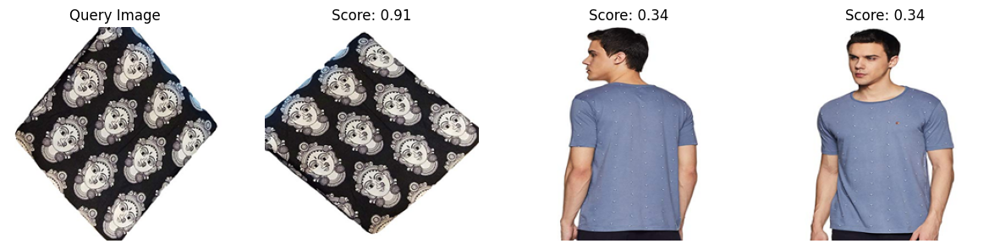

In [11]:
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import matplotlib.pyplot as plt

# Initialize the MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')

def process_image(image_url):
    """Fetch and preprocess an image from a URL."""
    try:
        response = requests.get(image_url, timeout=5)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        img = img.resize((224, 224))  # Resize to model input size
        img_array = np.array(img)
        if img_array.shape[-1] != 3:  # Ensure RGB format
            img = img.convert("RGB")
            img_array = np.array(img)
        img_array = preprocess_input(img_array)
        return np.expand_dims(img_array, axis=0), img  # Return both processed and raw image
    except Exception as e:
        print(f"Error processing image: {image_url}, {e}")
        return None, None

def extract_features(image_urls):
    """Extract features for a list of image URLs using MobileNetV2."""
    features = []
    valid_urls = []
    raw_images = []
    for url in image_urls:
        processed_image, raw_image = process_image(url)
        if processed_image is not None:
            feature = base_model.predict(processed_image)
            features.append(feature[0])  # Flatten feature vector
            valid_urls.append(url)  # Keep track of successfully processed URLs
            raw_images.append(raw_image)
    return np.array(features), valid_urls, raw_images

def recommend_images(image_index, features, urls, raw_images, top_n=5):
    """
    Recommend similar images based on cosine similarity.
    
    Args:
        image_index (int): Index of the query image in the feature array.
        features (np.array): Extracted feature vectors.
        urls (list): List of image URLs.
        raw_images (list): List of raw PIL images.
        top_n (int): Number of recommendations.
        
    Returns:
        list: Recommended image URLs, raw images, and similarity scores.
    """
    query_features = features[image_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_features, features)[0]
    recommended_indices = np.argsort(similarity_scores)[::-1][1:top_n+1]  # Exclude the query image
    recommendations = [(urls[i], raw_images[i], similarity_scores[i]) for i in recommended_indices]
    return recommendations

def display_recommendations(query_image, recommendations):
    """Display the query image and its recommendations."""
    plt.figure(figsize=(15, 5))

    # Display query image
    plt.subplot(1, len(recommendations) + 1, 1)
    plt.imshow(query_image)
    plt.axis('off')
    plt.title("Query Image")

    # Display recommended images
    for i, (url, img, score) in enumerate(recommendations):
        plt.subplot(1, len(recommendations) + 1, i + 2)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Score: {score:.2f}")

    plt.show()

# Example: 50 image URLs
image_urls = [
    # Add 50 image URLs here as a list of strings
    "https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg",
    # Repeat or add more URLs to reach 50 items
]

# Limit to 50 images
image_urls = image_urls[:50]

# Extract features and raw images for the images
features, valid_urls, raw_images = extract_features(image_urls)

# Recommend images similar to the first one
query_index = 0
recommendations = recommend_images(query_index, features, valid_urls, raw_images)

# Display query image and recommendations
print(f"Query Image URL: {valid_urls[query_index]}")
print("Recommended Images:")
for url, _, score in recommendations:
    print(f"URL: {url}, Similarity Score: {score:.4f}")

# Visualize the recommendations
display_recommendations(raw_images[query_index], recommendations)


C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_18924\3715145672.py:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Query Image URL: https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg
Recommended Images:
URL: https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg, Similarity Score: 1.0000
URL: https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg, Similarity Score: 0.9084
URL: https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg, Similarity Score: 0.3424
URL: https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg, Similarity Score: 0.3393


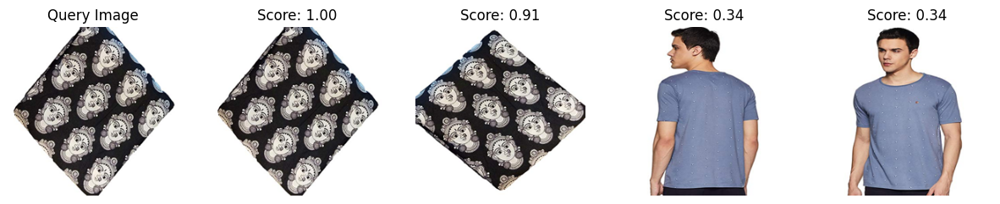

In [1]:
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import matplotlib.pyplot as plt

# Initialize the MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')

def process_image(image_url):
    """Fetch and preprocess an image from a URL."""
    try:
        response = requests.get(image_url, timeout=5)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        img = img.resize((224, 224))  # Resize to model input size
        img_array = np.array(img)
        if img_array.shape[-1] != 3:  # Ensure RGB format
            img = img.convert("RGB")
            img_array = np.array(img)
        img_array = preprocess_input(img_array)
        return np.expand_dims(img_array, axis=0), img  # Return both processed and raw image
    except Exception as e:
        print(f"Error processing image: {image_url}, {e}")
        return None, None

def extract_features(image_urls):
    """Extract features for a list of image URLs using MobileNetV2."""
    features = []
    valid_urls = []
    raw_images = []
    for url in image_urls:
        processed_image, raw_image = process_image(url)
        if processed_image is not None:
            feature = base_model.predict(processed_image)
            features.append(feature[0])  # Flatten feature vector
            valid_urls.append(url)  # Keep track of successfully processed URLs
            raw_images.append(raw_image)
    return np.array(features), valid_urls, raw_images

def recommend_images(image_index, features, urls, raw_images, top_n=5):
    """
    Recommend similar images based on cosine similarity.
    
    Args:
        image_index (int): Index of the query image in the feature array.
        features (np.array): Extracted feature vectors.
        urls (list): List of image URLs.
        raw_images (list): List of raw PIL images.
        top_n (int): Number of recommendations.
        
    Returns:
        list: Recommended image URLs, raw images, and similarity scores.
    """
    query_features = features[image_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_features, features)[0]
    recommended_indices = np.argsort(similarity_scores)[::-1][1:top_n+1]  # Exclude the query image
    recommendations = [(urls[i], raw_images[i], similarity_scores[i]) for i in recommended_indices]
    return recommendations

def display_recommendations(query_image, recommendations):
    """Display the query image and its recommendations."""
    plt.figure(figsize=(15, 5))

    # Display query image
    plt.subplot(1, len(recommendations) + 1, 1)
    plt.imshow(query_image)
    plt.axis('off')
    plt.title("Query Image")

    # Display recommended images
    for i, (url, img, score) in enumerate(recommendations):
        plt.subplot(1, len(recommendations) + 1, i + 2)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Score: {score:.2f}")

    plt.show()

# Example: 50 image URLs
image_urls = [
    "https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/51tylkSxAIL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/41fqj9cvevL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/41gTOgKzJpL.jpg",
    "https://images-na.ssl-images-amazon.com/images/I/51Wj2WownyL.jpg",
    # Repeat or add more URLs until you have 50 items
]

# Limit to 50 images
image_urls = image_urls[:50]

# Extract features and raw images for the images
features, valid_urls, raw_images = extract_features(image_urls)

# Recommend images similar to the first one
query_index = 0
recommendations = recommend_images(query_index, features, valid_urls, raw_images)

# Display query image and recommendations
print(f"Query Image URL: {valid_urls[query_index]}")
print("Recommended Images:")
for url, _, score in recommendations:
    print(f"URL: {url}, Similarity Score: {score:.4f}")

# Visualize the recommendations
display_recommendations(raw_images[query_index], recommendations)


In [11]:
# Debugging JSON file loading
import json

def debug_json_file(file_path):
    """Debug and validate the JSON file."""
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            data = json.load(file)
        print("JSON loaded successfully!")
        print("Sample data:", data[:2])  # Print the first two entries
        return data
    except FileNotFoundError:
        print(f"Error: File not found: {file_path}")
    except json.JSONDecodeError as e:
        print(f"Error in JSON file at line {e.lineno}, column {e.colno}: {e.msg}")
    except Exception as e:
        print(f"Unexpected error: {e}")
    return None

# Test the function
data = debug_json_file('fashion_products_data.json')


Error in JSON file at line 2, column 1: Extra data


In [12]:
import pandas as pd
import json
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import matplotlib.pyplot as plt


def load_json_file(file_path):
    """Load a JSON file with error handling."""
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            data = json.load(file)
        print("JSON file loaded successfully!")
        return data
    except FileNotFoundError:
        print(f"Error: File not found: {file_path}")
    except json.JSONDecodeError as e:
        print(f"Error in JSON file at line {e.lineno}, column {e.colno}: {e.msg}")
    except Exception as e:
        print(f"Unexpected error: {e}")
    return None


# Load the JSON dataset
data = load_json_file('fashion_products_data.json')

# Exit if dataset loading failed
if not data:
    raise ValueError("Failed to load the JSON dataset.")

# Convert JSON to DataFrame
df = pd.DataFrame(data)

# Ensure the dataset contains at least 50 image URLs
image_urls = df['medium'][:50].tolist()

# Initialize MobileNetV2 model for feature extraction
base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')

def process_image(image_url):
    """Fetch and preprocess an image from a URL."""
    try:
        response = requests.get(image_url, timeout=5)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        img = img.resize((224, 224))  # Resize to MobileNetV2 input size
        img_array = np.array(img)
        if img_array.shape[-1] != 3:  # Ensure 3 channels (RGB)
            img = img.convert("RGB")
            img_array = np.array(img)
        img_array = preprocess_input(img_array)
        return np.expand_dims(img_array, axis=0), img  # Preprocessed and raw images
    except Exception as e:
        print(f"Error processing image URL: {image_url}, {e}")
        return None, None

def extract_features(image_urls):
    """Extract image features using MobileNetV2."""
    features = []
    valid_urls = []
    raw_images = []
    for url in image_urls:
        processed_image, raw_image = process_image(url)
        if processed_image is not None:
            feature = base_model.predict(processed_image)
            features.append(feature[0])  # Flatten feature vector
            valid_urls.append(url)
            raw_images.append(raw_image)
    return np.array(features), valid_urls, raw_images

def recommend_images(image_index, features, urls, raw_images, top_n=5):
    """
    Recommend similar images based on cosine similarity.
    
    Args:
        image_index (int): Index of the query image in the feature array.
        features (np.array): Extracted feature vectors.
        urls (list): List of image URLs.
        raw_images (list): List of raw PIL images.
        top_n (int): Number of recommendations.
        
    Returns:
        list: Recommended image URLs, raw images, and similarity scores.
    """
    query_features = features[image_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_features, features)[0]
    recommended_indices = np.argsort(similarity_scores)[::-1][1:top_n+1]  # Exclude query image
    recommendations = [(urls[i], raw_images[i], similarity_scores[i]) for i in recommended_indices]
    return recommendations

def display_recommendations(query_image, recommendations):
    """Display the query image and its recommendations."""
    plt.figure(figsize=(15, 5))

    # Display query image
    plt.subplot(1, len(recommendations) + 1, 1)
    plt.imshow(query_image)
    plt.axis('off')
    plt.title("Query Image")

    # Display recommended images
    for i, (url, img, score) in enumerate(recommendations):
        plt.subplot(1, len(recommendations) + 1, i + 2)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Score: {score:.2f}")

    plt.show()

# Extract features from the image URLs
features, valid_urls, raw_images = extract_features(image_urls)

# Exit if no valid features or images were extracted
if features.size == 0 or len(raw_images) == 0:
    raise ValueError("No valid images or features extracted. Check image URLs or dataset.")

# Choose a query image index (e.g., 0 for the first image)
query_index = 0
recommendations = recommend_images(query_index, features, valid_urls, raw_images)

# Display query image URL and recommendations
print(f"Query Image URL: {valid_urls[query_index]}")
print("Recommended Images:")
for url, _, score in recommendations:
    print(f"URL: {url}, Similarity Score: {score:.4f}")

# Visualize the query image and its recommendations
display_recommendations(raw_images[query_index], recommendations)


Error in JSON file at line 2, column 1: Extra data


ValueError: Failed to load the JSON dataset.

In [ ]:
import numpy as np
import pandas as pd
import requests
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from PIL import Image as PILImage
from io import BytesIO
from IPython.display import Image, display

# Load dataset
file_path = "D:\\AI stylies\\fashion_products_data.json"
data = pd.read_json(file_path, lines=True)

# Fill missing values in product_name and brand columns
data.fillna({'product_name': '', 'brand': '', 'image_urls__small': '', 'large': ''}, inplace=True)

# Handle missing or empty image URLs
default_image_url = "https://example.com/default_image.jpg"  # Replace this with a default image URL if needed
data['large'].fillna(default_image_url, inplace=True)  # Use default image URL for missing entries

# Function to extract image features using MobileNetV2
def extract_image_features(image_url, model):
    try:
        # Fetch and open the image from the URL
        if not image_url.startswith('http'):
            image_url = default_image_url  # If URL is invalid or missing, use default image
        
        response = requests.get(image_url)
        img = PILImage.open(BytesIO(response.content))
        
        # Resize image to 224x224, which is the required input size for MobileNetV2
        img = img.resize((224, 224))
        
        # Convert image to array and preprocess for MobileNetV2
        img_array = np.array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)
        
        # Extract features using the MobileNetV2 model
        feature_vector = model.predict(img_array)
        
        return feature_vector.flatten()
    except Exception as e:
        print(f"Error in extracting features: {e}")
        return None

# Load the MobileNetV2 model once (instead of in each loop)
model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')

# Extract image features for all products (this could take some time depending on dataset size)
def extract_all_image_features(data, model):
    image_features = []
    for idx, row in data.iterrows():
        image_url = row['large']
        features = extract_image_features(image_url, model)
        if features is not None:
            image_features.append(features)
        else:
            image_features.append(np.zeros(1280))  # Default to zero vector if feature extraction fails
    return np.array(image_features)

# Extract image features for all products
image_features = extract_all_image_features(data, model)

# Build and compile the neural network model
def build_nn_model(input_shape):
    input_layer = Input(shape=input_shape)
    x = Dense(512, activation='relu')(input_layer)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    output_layer = Dense(1, activation='sigmoid')(x)  # For binary classification (similar/dissimilar)

    model = Model(inputs=input_layer, outputs=output_layer)
    
    # Corrected the learning rate argument
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Prepare pairs of image features and labels for training
def create_pairs(data, image_features):
    pairs = []
    labels = []
    
    # For simplicity, we'll create pairs by using the first 30 images from the dataset
    for i in range(30):
        for j in range(i+1, 30):
            pairs.append([image_features[i], image_features[j]])
            # Label 1 if same brand, 0 if different brand
            labels.append(1 if data.iloc[i]['brand'] == data.iloc[j]['brand'] else 0)
    
    pairs = np.array(pairs)
    labels = np.array(labels)
    
    return pairs, labels

# Create pairs for training
pairs, labels = create_pairs(data, image_features)

# Build and train the model
input_shape = (image_features.shape[1],)
model = build_nn_model(input_shape)

# Train the model for 5 epochs
model.fit(pairs, labels, epochs=5, batch_size=32)

# Function for image-based recommendation
def recommend_by_image(product_asin, num_recommendations=3):
    # Find the index of the input product based on ASIN
    input_product = data[data['asin'] == product_asin]
    if input_product.empty:
        print(f"Product with ASIN {product_asin} not found in the dataset.")
        return None
    
    input_index = input_product.index[0]
    input_image_features = image_features[input_index]
    
    # Calculate cosine similarity with all other products
    similarity_scores = []
    for idx, product_features in enumerate(image_features):
        if idx != input_index:  # Exclude the input product itself
            similarity = cosine_similarity([input_image_features], [product_features]).flatten()[0]
            similarity_scores.append((idx, similarity))
    
    # Sort by similarity and return top recommendations
    similarity_scores.sort(key=lambda x: x[1], reverse=True)
    recommended_indices = [idx for idx, _ in similarity_scores[:num_recommendations]]
    recommended_products = data.iloc[recommended_indices]
    
    return recommended_products

# Example usage: provide the ASIN of the product you want to base the recommendation on
product_asin = "B07NVPVNKC"  # Replace with actual ASIN
recommended_products = recommend_by_image(product_asin, num_recommendations=6)

# Display recommended products and their images
if recommended_products is not None:
    for _, row in recommended_products.iterrows():
        print(f"Recommended Product: {row['product_name']}")
        print(f"Brand: {row['brand']}")
        print(f"ASIN: {row['asin']}")
        print(f"Price: {row['sales_price'] if 'sales_price' in row else 'N/A'}")
        print(f"Rating: {row['rating'] if 'rating' in row else 'N/A'}")
        
        # Display the larger image
        large_image_url = row['large']
        display(Image(url=large_image_url, width=400, height=300))  # Adjust size for better clarity
        print("="*50)


C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_20496\2978636150.py:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['large'].fillna(default_image_url, inplace=True)  # Use default image URL for missing entries
C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_20496\2978636150.py:53: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  model = MobileNetV2(weights='imagenet', include_top=False, p

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━

In [10]:
import numpy as np
import pandas as pd
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from PIL import Image
from tqdm import tqdm  # For progress bar
from io import BytesIO
import requests

# Dataset Preparation
def fetch_image(url):
    try:
        response = requests.get(url, timeout=5)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image = image.resize((224, 224))
        return img_to_array(image)
    except Exception as e:
        print(f"Error fetching image: {e}")
        return None

# Load and preprocess dataset
file_path = r"D:\AI stylies\fashion_products_data.json"  # Use raw string to handle backslashes
try:
    df = pd.read_json(file_path, lines=True)
    print("Dataset loaded successfully!")
except FileNotFoundError as e:
    print(f"Error: {e}")
    print("Please verify the file path and try again.")


# Filter dataset
df_filtered = df[df['medium'].notnull() & df['product_name'].notnull()]
df = df_filtered.head(50)  # Use only the first 50 rows

# Initialize loading screen for downloading and preprocessing images
print("Fetching and preprocessing the first 50 images... Please wait.")
images, labels = [], []
for idx, row in tqdm(df.iterrows(), total=len(df), desc="Processing Images"):
    image = fetch_image(row["medium"])
    if image is not None:
        images.append(image)
        labels.append(row["product_name"])

images = np.array(images)
labels = pd.get_dummies(labels).values

# Split dataset
print("\nSplitting dataset into training and validation sets...")
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)

X_train = preprocess_input(X_train)
X_val = preprocess_input(X_val)

# Build the Model
print("\nBuilding the VGG19 model...")
base_model = VGG19(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation="relu"),
    Dropout(0.5),
    Dense(labels.shape[1], activation="softmax")
])

model.compile(optimizer=Adam(learning_rate=0.001), loss="categorical_crossentropy", metrics=["accuracy"])

# Train the Model
print("\nTraining the model on the first 50 images...")
model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=16, verbose=1)

# Save the Model
print("\nSaving the trained model...")
model.save("vgg19_dress_classifier_50_images.h5")
print("\nModel saved as 'vgg19_dress_classifier_50_images.h5'.")


Dataset loaded successfully!
Fetching and preprocessing the first 50 images... Please wait.


Processing Images: 100%|██████████| 50/50 [00:39<00:00,  1.25it/s]



Splitting dataset into training and validation sets...

Building the VGG19 model...
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 63s 1us/step

Training the model on the first 50 images...
Epoch 1/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 13s 4s/step - accuracy: 0.0359 - loss: 9.8965 - val_accuracy: 0.0000e+00 - val_loss: 9.3507
Epoch 2/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - accuracy: 0.1656 - loss: 5.6516 - val_accuracy: 0.0000e+00 - val_loss: 10.1690
Epoch 3/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - accuracy: 0.2016 - loss: 4.9305 - val_accuracy: 0.0000e+00 - val_loss: 10.9995
Epoch 4/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - accuracy: 0.4109 - loss: 2.8162 - val_accuracy: 0.0000e+00 - val_loss: 11.7017
Epoch 5/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - accuracy: 0.3594 - loss: 2.4649 - val_accuracy: 0.0000e+00 - val_loss: 12.2895



Saving the trained model...

Model saved as 'vgg19_dress_classifier_50_images.h5'.


In [14]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model, Sequential
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from PIL import Image
from io import BytesIO
import requests
from sklearn.metrics.pairwise import cosine_similarity
from tqdm import tqdm
from IPython.display import display, HTML

# Load the trained model
model = load_model("vgg19_dress_classifier_50_images.h5")

# Feature extraction model (removing the final classification layer)
feature_extractor = Sequential(model.layers[:-2])  # Remove the last two layers

# Function to fetch and preprocess an image
def fetch_and_preprocess_image(url):
    try:
        response = requests.get(url, timeout=5)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image = image.resize((224, 224))
        image_array = img_to_array(image)
        return preprocess_input(np.expand_dims(image_array, axis=0))  # Preprocess and add batch dimension
    except Exception as e:
        print(f"Error fetching image: {e}")
        return None

# Extract features for all images in the dataset
def extract_features(df):
    features = []
    for idx, row in tqdm(df.iterrows(), total=len(df), desc="Extracting Features"):
        preprocessed_image = fetch_and_preprocess_image(row["medium"])
        if preprocessed_image is not None:
            feature = feature_extractor.predict(preprocessed_image)
            features.append(feature.flatten())
        else:
            features.append(None)
    df["features"] = features
    return df

# Find similar images based on cosine similarity
def find_similar_images(asin, df, top_n=5):
    # Get the query image row
    query_row = df[df["asin"] == asin].iloc[0]
    query_features = query_row["features"]

    if query_features is None:
        print(f"No features found for ASIN '{asin}'.")
        return

    # Calculate cosine similarity
    similarities = []
    for idx, row in df.iterrows():
        if row["features"] is not None:
            sim = cosine_similarity([query_features], [row["features"]])[0][0]
            similarities.append((idx, sim))

    # Sort by similarity score in descending order
    sorted_similarities = sorted(similarities, key=lambda x: x[1], reverse=True)

    # Display top N similar images
    html_content = f"<h2>Similar Images for ASIN '{asin}'</h2><div style='display: flex; flex-wrap: wrap; gap: 20px;'>"
    for i, (idx, sim_score) in enumerate(sorted_similarities[:top_n]):
        similar_row = df.iloc[idx]
        html_content += f"""
        <div style='border: 1px solid #ddd; border-radius: 5px; padding: 10px; text-align: center;'>
            <img src='{similar_row["medium"]}' style='width: 200px; height: 200px; object-fit: cover; border-radius: 5px;' />
            <p><strong>ASIN:</strong> {similar_row["asin"]}</p>
            <p><strong>Similarity:</strong> {sim_score:.4f}</p>
        </div>
        """
    html_content += "</div>"
    display(HTML(html_content))

# Prepare dataset (if not already done)
df = df_filtered.head(50)  # Use the same 50 images
df = extract_features(df)

# Example usage: Find similar images for a given ASIN
find_similar_images("B07PYSF4WZ", df, top_n=3)


Extracting Features:   0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting Features:   2%|▏         | 1/50 [00:02<01:41,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting Features:   4%|▍         | 2/50 [00:03<01:14,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting Features:   6%|▌         | 3/50 [00:04<01:04,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting Features:   8%|▊         | 4/50 [00:05<00:59,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting Features:  10%|█         | 5/50 [00:06<00:53,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


Extracting Features:  12%|█▏        | 6/50 [00:07<00:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting Features:  14%|█▍        | 7/50 [00:09<00:52,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 724ms/step


Extracting Features:  16%|█▌        | 8/50 [00:10<00:59,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


Extracting Features:  18%|█▊        | 9/50 [00:12<00:59,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting Features:  20%|██        | 10/50 [00:13<00:57,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting Features:  22%|██▏       | 11/50 [00:16<01:05,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting Features:  24%|██▍       | 12/50 [00:17<01:03,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting Features:  26%|██▌       | 13/50 [00:18<00:56,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting Features:  28%|██▊       | 14/50 [00:20<00:59,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting Features:  30%|███       | 15/50 [00:22<00:54,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting Features:  32%|███▏      | 16/50 [00:24<01:04,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting Features:  34%|███▍      | 17/50 [00:26<00:55,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting Features:  36%|███▌      | 18/50 [00:27<00:48,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting Features:  38%|███▊      | 19/50 [00:28<00:45,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting Features:  40%|████      | 20/50 [00:29<00:40,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step


Extracting Features:  42%|████▏     | 21/50 [00:31<00:40,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting Features:  44%|████▍     | 22/50 [00:32<00:36,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting Features:  46%|████▌     | 23/50 [00:33<00:32,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting Features:  48%|████▊     | 24/50 [00:34<00:31,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting Features:  50%|█████     | 25/50 [00:35<00:28,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step


Extracting Features:  52%|█████▏    | 26/50 [00:36<00:29,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


Extracting Features:  54%|█████▍    | 27/50 [00:38<00:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting Features:  56%|█████▌    | 28/50 [00:39<00:28,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step


Extracting Features:  58%|█████▊    | 29/50 [00:41<00:30,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting Features:  60%|██████    | 30/50 [00:42<00:28,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting Features:  62%|██████▏   | 31/50 [00:44<00:28,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting Features:  64%|██████▍   | 32/50 [00:45<00:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting Features:  66%|██████▌   | 33/50 [00:46<00:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting Features:  68%|██████▊   | 34/50 [00:47<00:20,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


Extracting Features:  70%|███████   | 35/50 [00:49<00:21,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting Features:  72%|███████▏  | 36/50 [00:51<00:20,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting Features:  74%|███████▍  | 37/50 [00:53<00:20,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting Features:  76%|███████▌  | 38/50 [00:54<00:18,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting Features:  78%|███████▊  | 39/50 [00:55<00:16,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 721ms/step


Extracting Features:  80%|████████  | 40/50 [00:57<00:14,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting Features:  82%|████████▏ | 41/50 [00:59<00:14,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting Features:  84%|████████▍ | 42/50 [01:01<00:13,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting Features:  86%|████████▌ | 43/50 [01:02<00:10,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step


Extracting Features:  88%|████████▊ | 44/50 [01:03<00:08,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting Features:  90%|█████████ | 45/50 [01:04<00:06,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting Features:  92%|█████████▏| 46/50 [01:06<00:05,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step


Extracting Features:  94%|█████████▍| 47/50 [01:07<00:04,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


Extracting Features:  96%|█████████▌| 48/50 [01:09<00:02,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting Features:  98%|█████████▊| 49/50 [01:10<00:01,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


Extracting Features: 100%|██████████| 50/50 [01:11<00:00,  1.44s/it]
C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_13272\3372388115.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["features"] = features


In [1]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model, Sequential
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import tqdm
from PIL import Image
from io import BytesIO
import requests
from IPython.display import display, HTML

# Load the trained model
model = load_model("vgg19_dress_classifier_50_images.h5")

# Feature extraction model (removing the final classification layer)
feature_extractor = Sequential(model.layers[:-2])  # Remove the last two layers

# Function to fetch and preprocess an image
def fetch_and_preprocess_image(url):
    try:
        response = requests.get(url, timeout=5)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image = image.resize((224, 224))
        image_array = img_to_array(image)
        return preprocess_input(np.expand_dims(image_array, axis=0))  # Preprocess and add batch dimension
    except Exception as e:
        print(f"Error fetching image: {e}")
        return None

# Extract image features for all products
def extract_image_features(df):
    features = []
    for idx, row in tqdm(df.iterrows(), total=len(df), desc="Extracting Image Features"):
        preprocessed_image = fetch_and_preprocess_image(row["medium"])
        if preprocessed_image is not None:
            feature = feature_extractor.predict(preprocessed_image)
            features.append(feature.flatten())
        else:
            features.append(None)
    df["image_features"] = features
    return df

# Extract text features using TF-IDF
def extract_text_features(df):
    vectorizer = TfidfVectorizer(stop_words="english")
    tfidf_matrix = vectorizer.fit_transform(df["product_name"])
    return tfidf_matrix

# Hybrid recommendation function
def hybrid_recommendation(asin, df, tfidf_matrix, top_n=5, alpha=0.5):
    """
    Recommend similar products based on combined image and text features.
    :param asin: The ASIN of the query product.
    :param df: The dataframe with product details and features.
    :param tfidf_matrix: The TF-IDF matrix for product names.
    :param top_n: Number of recommendations to display.
    :param alpha: Weight for combining image and text similarity (0 ≤ alpha ≤ 1).
    """
    # Get the query product row
    query_row = df[df["asin"] == asin].iloc[0]
    query_image_features = query_row["image_features"]
    query_text_index = df[df["asin"] == asin].index[0]

    # Validate the query product
    if query_image_features is None:
        print(f"No image features found for ASIN '{asin}'.")
        return

    # Calculate image similarity
    image_similarities = []
    for idx, row in df.iterrows():
        if row["image_features"] is not None:
            sim = cosine_similarity([query_image_features], [row["image_features"]])[0][0]
            image_similarities.append(sim)
        else:
            image_similarities.append(0)
    image_similarities = np.array(image_similarities)

    # Calculate text similarity
    text_similarities = cosine_similarity(tfidf_matrix[query_text_index], tfidf_matrix).flatten()

    # Combine similarities
    combined_similarities = alpha * image_similarities + (1 - alpha) * text_similarities

    # Get top N recommendations
    top_indices = np.argsort(combined_similarities)[::-1][:top_n]

    # Display recommendations
    html_content = f"<h2>Recommendations for ASIN '{asin}'</h2><div style='display: flex; flex-wrap: wrap; gap: 20px;'>"
    for idx in top_indices:
        recommended_row = df.iloc[idx]
        html_content += f"""
        <div style='border: 1px solid #ddd; border-radius: 5px; padding: 10px; text-align: center;'>
            <img src='{recommended_row["medium"]}' style='width: 200px; height: 200px; object-fit: cover; border-radius: 5px;' />
            <p><strong>ASIN:</strong> {recommended_row["asin"]}</p>
            <p><strong>Product Name:</strong> {recommended_row["product_name"]}</p>
            <p><strong>Similarity Score:</strong> {combined_similarities[idx]:.4f}</p>
        </div>
        """
    html_content += "</div>"
    display(HTML(html_content))

# Prepare the dataset
file_path = r"D:\AI stylies\fashion_products_data.json"  # Use raw string to handle backslashes
df = pd.read_json(file_path, lines=True)
df_filtered = df[df['medium'].notnull() & df['product_name'].notnull()]
df = df_filtered.head(50)  # Use only 50 products for testing

# Extract features
print("Extracting image features...")
df = extract_image_features(df)
print("Extracting text features...")
tfidf_matrix = extract_text_features(df)

# Example usage: Find recommendations for a given ASIN
hybrid_recommendation("B07PYSF4WZ", df, tfidf_matrix, top_n=5, alpha=0.7)


Extracting image features...


Extracting Image Features:   0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting Image Features:   2%|▏         | 1/50 [00:03<03:01,  3.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting Image Features:   4%|▍         | 2/50 [00:07<03:12,  4.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting Image Features:   6%|▌         | 3/50 [00:09<02:09,  2.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting Image Features:   8%|▊         | 4/50 [00:10<01:37,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step


Extracting Image Features:  10%|█         | 5/50 [00:12<01:30,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting Image Features:  12%|█▏        | 6/50 [00:14<01:30,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 748ms/step


Extracting Image Features:  14%|█▍        | 7/50 [00:15<01:19,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting Image Features:  16%|█▌        | 8/50 [00:17<01:16,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting Image Features:  18%|█▊        | 9/50 [00:19<01:18,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


Extracting Image Features:  20%|██        | 10/50 [00:21<01:15,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step


Extracting Image Features:  22%|██▏       | 11/50 [00:23<01:14,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step


Extracting Image Features:  24%|██▍       | 12/50 [00:25<01:11,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


Extracting Image Features:  26%|██▌       | 13/50 [00:26<01:04,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting Image Features:  28%|██▊       | 14/50 [00:29<01:11,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting Image Features:  30%|███       | 15/50 [00:31<01:08,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting Image Features:  32%|███▏      | 16/50 [00:33<01:07,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting Image Features:  34%|███▍      | 17/50 [00:34<01:03,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting Image Features:  36%|███▌      | 18/50 [00:39<01:25,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


Extracting Image Features:  38%|███▊      | 19/50 [00:41<01:15,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting Image Features:  40%|████      | 20/50 [00:43<01:15,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


Extracting Image Features:  42%|████▏     | 21/50 [00:46<01:09,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step


Extracting Image Features:  44%|████▍     | 22/50 [00:47<00:58,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting Image Features:  46%|████▌     | 23/50 [00:48<00:48,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting Image Features:  48%|████▊     | 24/50 [00:50<00:46,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


Extracting Image Features:  50%|█████     | 25/50 [00:52<00:50,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting Image Features:  52%|█████▏    | 26/50 [00:55<00:50,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting Image Features:  54%|█████▍    | 27/50 [00:56<00:45,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting Image Features:  56%|█████▌    | 28/50 [00:59<00:48,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting Image Features:  58%|█████▊    | 29/50 [01:02<00:52,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting Image Features:  60%|██████    | 30/50 [01:04<00:42,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting Image Features:  62%|██████▏   | 31/50 [01:04<00:33,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting Image Features:  64%|██████▍   | 32/50 [01:08<00:38,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting Image Features:  66%|██████▌   | 33/50 [01:09<00:35,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting Image Features:  68%|██████▊   | 34/50 [01:12<00:34,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting Image Features:  70%|███████   | 35/50 [01:13<00:29,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting Image Features:  72%|███████▏  | 36/50 [01:15<00:26,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting Image Features:  74%|███████▍  | 37/50 [01:19<00:34,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting Image Features:  76%|███████▌  | 38/50 [01:22<00:31,  2.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting Image Features:  78%|███████▊  | 39/50 [01:26<00:32,  2.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting Image Features:  80%|████████  | 40/50 [01:28<00:26,  2.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting Image Features:  82%|████████▏ | 41/50 [01:30<00:23,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step


Extracting Image Features:  84%|████████▍ | 42/50 [01:32<00:18,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting Image Features:  86%|████████▌ | 43/50 [01:34<00:15,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting Image Features:  88%|████████▊ | 44/50 [01:38<00:17,  2.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting Image Features:  90%|█████████ | 45/50 [01:47<00:23,  4.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


Extracting Image Features:  92%|█████████▏| 46/50 [01:52<00:19,  4.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


Extracting Image Features:  94%|█████████▍| 47/50 [01:54<00:12,  4.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step


Extracting Image Features:  96%|█████████▌| 48/50 [01:56<00:06,  3.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting Image Features:  98%|█████████▊| 49/50 [01:59<00:03,  3.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting Image Features: 100%|██████████| 50/50 [02:01<00:00,  2.43s/it]

Extracting text features...



C:\Users\Akshay Chaudhari\AppData\Local\Temp\ipykernel_23740\2493199631.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["image_features"] = features


In [3]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model, Sequential
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
from io import BytesIO
import requests
from tqdm import tqdm
from IPython.display import display, HTML

# Load the trained model
model = load_model("vgg19_dress_classifier_50_images.h5")

# Feature extraction model (removing the final classification layer)
feature_extractor = Sequential(model.layers[:-2])  # Remove the last two layers

# Function to fetch and preprocess an image
def fetch_and_preprocess_image(url):
    try:
        response = requests.get(url, timeout=5)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image = image.resize((224, 224))
        image_array = img_to_array(image)
        return preprocess_input(np.expand_dims(image_array, axis=0))  # Preprocess and add batch dimension
    except Exception as e:
        print(f"Error fetching image: {e}")
        return None

# Extract features for all images in the dataset
def extract_features(df):
    features = []
    for idx, row in tqdm(df.iterrows(), total=len(df), desc="Extracting Features"):
        preprocessed_image = fetch_and_preprocess_image(row["medium"])
        if preprocessed_image is not None:
            feature = feature_extractor.predict(preprocessed_image)
            features.append(feature.flatten())
        else:
            features.append(None)
    df["image_features"] = features
    return df

# Normalize the rating column
def preprocess_brand_and_rating(df):
    # Encode brands as integers
    df["brand_encoded"] = df["brand"].astype("category").cat.codes
    # Normalize ratings between 0 and 1
    df["rating_normalized"] = (df["rating"] - df["rating"].min()) / (df["rating"].max() - df["rating"].min())
    return df

# Hybrid recommendation function
def hybrid_recommendation(asin, df, top_n=5, weights=(0.5, 0.3, 0.2)):
    """
    Recommend similar products based on image, brand, and rating similarity.
    :param asin: The ASIN of the query product.
    :param df: The dataframe with product details and features.
    :param top_n: Number of recommendations to display.
    :param weights: Weights for image, brand, and rating similarities (sum should be 1).
    """
    w_image, w_brand, w_rating = weights

    # Check if the ASIN exists in the dataset
    if asin not in df["asin"].values:
        print(f"Error: ASIN '{asin}' not found in the dataset.")
        return

    # Get the query product row
    query_row = df[df["asin"] == asin].iloc[0]
    query_image_features = query_row["image_features"]
    query_brand = query_row["brand_encoded"]
    query_rating = query_row["rating_normalized"]

    # Validate the query product
    if query_image_features is None:
        print(f"No image features found for ASIN '{asin}'.")
        return

    # Calculate image similarity
    image_similarities = []
    for idx, row in df.iterrows():
        if row["image_features"] is not None:
            sim = cosine_similarity([query_image_features], [row["image_features"]])[0][0]
            image_similarities.append(sim)
        else:
            image_similarities.append(0)
    image_similarities = np.array(image_similarities)

    # Calculate brand similarity (1 if the same brand, 0 otherwise)
    brand_similarities = np.array(df["brand_encoded"] == query_brand, dtype=float)

    # Calculate rating similarity (absolute difference scaled inversely)
    rating_similarities = 1 - np.abs(df["rating_normalized"] - query_rating)

    # Combine similarities
    combined_similarities = (
        w_image * image_similarities +
        w_brand * brand_similarities +
        w_rating * rating_similarities
    )

    # Get top N recommendations
    top_indices = np.argsort(combined_similarities)[::-1][:top_n]

    # Display recommendations
    html_content = f"<h2>Recommendations for ASIN '{asin}'</h2><div style='display: flex; flex-wrap: wrap; gap: 20px;'>"
    for idx in top_indices:
        recommended_row = df.iloc[idx]
        html_content += f"""
        <div style='border: 1px solid #ddd; border-radius: 5px; padding: 10px; text-align: center;'>
            <img src='{recommended_row["medium"]}' style='width: 200px; height: 200px; object-fit: cover; border-radius: 5px;' />
            <p><strong>ASIN:</strong> {recommended_row["asin"]}</p>
            <p><strong>Brand:</strong> {recommended_row["brand"]}</p>
            <p><strong>Rating:</strong> {recommended_row["rating"]:.2f}</p>
            <p><strong>Similarity Score:</strong> {combined_similarities[idx]:.4f}</p>
        </div>
        """
    html_content += "</div>"
    display(HTML(html_content))

# Load dataset
file_path = r"D:\AI stylies\fashion_products_data.json"
try:
    df = pd.read_json(file_path, lines=True)
    print("Dataset loaded successfully!")
except FileNotFoundError as e:
    print(f"Error: {e}")
    print("Please verify the file path and try again.")

# Filter dataset
df = df[df['medium'].notnull() & df['product_name'].notnull()]
df = df.head(50)  # Use only the first 50 rows

# Extract features and preprocess
df = extract_features(df)
df = preprocess_brand_and_rating(df)

# Example usage: Find recommendations for a given ASIN
hybrid_recommendation("B07PYSF4WZ", df, top_n=5, weights=(0.5, 0.3, 0.2))


Dataset loaded successfully!


Extracting Features:   0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting Features:   2%|▏         | 1/50 [00:03<02:39,  3.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting Features:   4%|▍         | 2/50 [00:04<01:36,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting Features:   6%|▌         | 3/50 [00:05<01:13,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting Features:   8%|▊         | 4/50 [00:06<01:02,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


Extracting Features:  10%|█         | 5/50 [00:07<01:03,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting Features:  12%|█▏        | 6/50 [00:09<00:56,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


Extracting Features:  14%|█▍        | 7/50 [00:10<00:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting Features:  16%|█▌        | 8/50 [00:11<00:53,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting Features:  18%|█▊        | 9/50 [00:12<00:51,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting Features:  20%|██        | 10/50 [00:14<00:50,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting Features:  22%|██▏       | 11/50 [00:15<00:49,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting Features:  24%|██▍       | 12/50 [00:16<00:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting Features:  26%|██▌       | 13/50 [00:17<00:46,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting Features:  28%|██▊       | 14/50 [00:19<00:46,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting Features:  30%|███       | 15/50 [00:20<00:43,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting Features:  32%|███▏      | 16/50 [00:21<00:41,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting Features:  34%|███▍      | 17/50 [00:22<00:38,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting Features:  36%|███▌      | 18/50 [00:23<00:38,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting Features:  38%|███▊      | 19/50 [00:24<00:36,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting Features:  40%|████      | 20/50 [00:26<00:36,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


Extracting Features:  42%|████▏     | 21/50 [00:27<00:35,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


Extracting Features:  44%|████▍     | 22/50 [00:28<00:34,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting Features:  46%|████▌     | 23/50 [00:30<00:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting Features:  48%|████▊     | 24/50 [00:31<00:32,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting Features:  50%|█████     | 25/50 [00:32<00:30,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


Extracting Features:  52%|█████▏    | 26/50 [00:34<00:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


Extracting Features:  54%|█████▍    | 27/50 [00:35<00:31,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step


Extracting Features:  56%|█████▌    | 28/50 [00:37<00:31,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


Extracting Features:  58%|█████▊    | 29/50 [00:38<00:30,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting Features:  60%|██████    | 30/50 [00:39<00:27,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting Features:  62%|██████▏   | 31/50 [00:41<00:26,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting Features:  64%|██████▍   | 32/50 [00:42<00:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting Features:  66%|██████▌   | 33/50 [00:44<00:25,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting Features:  68%|██████▊   | 34/50 [00:45<00:23,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting Features:  70%|███████   | 35/50 [00:46<00:21,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting Features:  72%|███████▏  | 36/50 [00:48<00:20,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step


Extracting Features:  74%|███████▍  | 37/50 [00:49<00:18,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting Features:  76%|███████▌  | 38/50 [00:51<00:18,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step


Extracting Features:  78%|███████▊  | 39/50 [00:53<00:18,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting Features:  80%|████████  | 40/50 [00:54<00:15,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting Features:  82%|████████▏ | 41/50 [00:56<00:13,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step


Extracting Features:  84%|████████▍ | 42/50 [00:58<00:13,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting Features:  86%|████████▌ | 43/50 [00:59<00:10,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting Features:  88%|████████▊ | 44/50 [01:00<00:08,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting Features:  90%|█████████ | 45/50 [01:02<00:07,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting Features:  92%|█████████▏| 46/50 [01:04<00:06,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step


Extracting Features:  94%|█████████▍| 47/50 [01:05<00:04,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting Features:  96%|█████████▌| 48/50 [01:07<00:03,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting Features:  98%|█████████▊| 49/50 [01:08<00:01,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step


Extracting Features: 100%|██████████| 50/50 [01:10<00:00,  1.40s/it]


In [6]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model, Sequential
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
from io import BytesIO
import requests
from tqdm import tqdm
from IPython.display import display, HTML

# Load the trained model
model = load_model("vgg19_dress_classifier_50_images.h5")

# Feature extraction model (removing the final classification layer)
feature_extractor = Sequential(model.layers[:-2])  # Remove the last two layers

# Function to fetch and preprocess an image
def fetch_and_preprocess_image(url):
    try:
        response = requests.get(url, timeout=5)
        image = Image.open(BytesIO(response.content)).convert("RGB")
        image = image.resize((224, 224))
        image_array = img_to_array(image)
        return preprocess_input(np.expand_dims(image_array, axis=0))  # Preprocess and add batch dimension
    except Exception as e:
        print(f"Error fetching image: {e}")
        return None

# Extract features for all images in the dataset
def extract_features(df):
    features = []
    for idx, row in tqdm(df.iterrows(), total=len(df), desc="Extracting Features"):
        preprocessed_image = fetch_and_preprocess_image(row["medium"])
        if preprocessed_image is not None:
            feature = feature_extractor.predict(preprocessed_image)
            features.append(feature.flatten())
        else:
            features.append(None)
    df["image_features"] = features
    return df

# Normalize the rating column
def preprocess_brand_and_rating(df):
    # Encode brands as integers
    df["brand_encoded"] = df["brand"].astype("category").cat.codes
    # Normalize ratings between 0 and 1
    df["rating_normalized"] = (df["rating"] - df["rating"].min()) / (df["rating"].max() - df["rating"].min())
    return df

# Hybrid recommendation function
def hybrid_recommendation(asin, df, top_n=5, weights=(0.5, 0.3, 0.2)):
    """
    Recommend similar products based on image, brand, and rating similarity, prioritizing high ratings.
    :param asin: The ASIN of the query product.
    :param df: The dataframe with product details and features.
    :param top_n: Number of recommendations to display.
    :param weights: Weights for image, brand, and rating similarities (sum should be 1).
    """
    w_image, w_brand, w_rating = weights

    # Check if the ASIN exists in the dataset
    if asin not in df["asin"].values:
        print(f"Error: ASIN '{asin}' not found in the dataset.")
        return

    # Get the query product row
    query_row = df[df["asin"] == asin].iloc[0]
    query_image_features = query_row["image_features"]
    query_brand = query_row["brand_encoded"]
    query_rating = query_row["rating_normalized"]

    # Validate the query product
    if query_image_features is None:
        print(f"No image features found for ASIN '{asin}'.")
        return

    # Calculate image similarity
    image_similarities = []
    for idx, row in df.iterrows():
        if row["image_features"] is not None:
            sim = cosine_similarity([query_image_features], [row["image_features"]])[0][0]
            image_similarities.append(sim)
        else:
            image_similarities.append(0)
    image_similarities = np.array(image_similarities)

    # Calculate brand similarity (1 if the same brand, 0 otherwise)
    brand_similarities = np.array(df["brand_encoded"] == query_brand, dtype=float)

    # Calculate rating similarity (absolute difference scaled inversely)
    rating_similarities = 1 - np.abs(df["rating_normalized"] - query_rating)

    # Combine similarities
    combined_similarities = (
        w_image * image_similarities +
        w_brand * brand_similarities +
        w_rating * rating_similarities
    )

    # Combine results into a dataframe for sorting
    results = pd.DataFrame({
        "asin": df["asin"],
        "medium": df["medium"],
        "brand": df["brand"],
        "rating": df["rating"],
        "combined_similarity": combined_similarities
    })

    # Sort by combined similarity first and then by rating (descending)
    results = results.sort_values(by=["combined_similarity", "rating"], ascending=[False, False])

    # Display top N recommendations
    html_content = f"<h2>Recommendations for ASIN '{asin}'</h2><div style='display: flex; flex-wrap: wrap; gap: 20px;'>"
    for idx, row in results.head(top_n).iterrows():
        html_content += f"""
        <div style='border: 1px solid #ddd; border-radius: 5px; padding: 10px; text-align: center;'>
            <img src='{row["medium"]}' style='width: 200px; height: 200px; object-fit: cover; border-radius: 5px;' />
            <p><strong>ASIN:</strong> {row["asin"]}</p>
            <p><strong>Brand:</strong> {row["brand"]}</p>
            <p><strong>Rating:</strong> {row["rating"]:.2f}</p>
            <p><strong>Similarity Score:</strong> {row["combined_similarity"]:.4f}</p>
        </div>
        """
    html_content += "</div>"
    display(HTML(html_content))

# Load dataset
file_path = r"D:\AI stylies\fashion_products_data.json"
try:
    df = pd.read_json(file_path, lines=True)
    print("Dataset loaded successfully!")
except FileNotFoundError as e:
    print(f"Error: {e}")
    print("Please verify the file path and try again.")

# Filter dataset
df = df[df['medium'].notnull() & df['product_name'].notnull()]
df = df.head(50)  # Use only the first 50 rows

# Extract features and preprocess
df = extract_features(df)
df = preprocess_brand_and_rating(df)

# Example usage: Find recommendations for a given ASIN
hybrid_recommendation("B07K6PHHHM", df, top_n=5, weights=(0.5, 0.3, 0.2))


Dataset loaded successfully!


Extracting Features:   0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting Features:   2%|▏         | 1/50 [00:01<01:29,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting Features:   4%|▍         | 2/50 [00:03<01:11,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting Features:   6%|▌         | 3/50 [00:04<01:07,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting Features:   8%|▊         | 4/50 [00:05<00:59,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


Extracting Features:  10%|█         | 5/50 [00:06<00:59,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting Features:  12%|█▏        | 6/50 [00:07<00:54,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting Features:  14%|█▍        | 7/50 [00:09<00:50,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting Features:  16%|█▌        | 8/50 [00:10<00:50,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting Features:  18%|█▊        | 9/50 [00:11<00:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting Features:  20%|██        | 10/50 [00:12<00:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting Features:  22%|██▏       | 11/50 [00:13<00:44,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step


Extracting Features:  24%|██▍       | 12/50 [00:14<00:45,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting Features:  26%|██▌       | 13/50 [00:16<00:44,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting Features:  28%|██▊       | 14/50 [00:17<00:43,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting Features:  30%|███       | 15/50 [00:18<00:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


Extracting Features:  32%|███▏      | 16/50 [00:19<00:40,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting Features:  34%|███▍      | 17/50 [00:20<00:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting Features:  36%|███▌      | 18/50 [00:21<00:36,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting Features:  38%|███▊      | 19/50 [00:23<00:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting Features:  40%|████      | 20/50 [00:24<00:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


Extracting Features:  42%|████▏     | 21/50 [00:25<00:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting Features:  44%|████▍     | 22/50 [00:26<00:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting Features:  46%|████▌     | 23/50 [00:27<00:31,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting Features:  48%|████▊     | 24/50 [00:28<00:29,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting Features:  50%|█████     | 25/50 [00:29<00:27,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting Features:  52%|█████▏    | 26/50 [00:31<00:32,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


Extracting Features:  54%|█████▍    | 27/50 [00:33<00:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step


Extracting Features:  56%|█████▌    | 28/50 [00:34<00:31,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting Features:  58%|█████▊    | 29/50 [00:36<00:29,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


Extracting Features:  60%|██████    | 30/50 [00:37<00:27,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting Features:  62%|██████▏   | 31/50 [00:38<00:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


Extracting Features:  64%|██████▍   | 32/50 [00:40<00:24,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting Features:  66%|██████▌   | 33/50 [00:41<00:24,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting Features:  68%|██████▊   | 34/50 [00:42<00:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 839ms/step


Extracting Features:  70%|███████   | 35/50 [00:44<00:21,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting Features:  72%|███████▏  | 36/50 [00:45<00:19,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting Features:  74%|███████▍  | 37/50 [00:47<00:17,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting Features:  76%|███████▌  | 38/50 [00:48<00:15,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


Extracting Features:  78%|███████▊  | 39/50 [00:49<00:13,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting Features:  80%|████████  | 40/50 [00:50<00:13,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step


Extracting Features:  82%|████████▏ | 41/50 [00:52<00:12,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 695ms/step


Extracting Features:  84%|████████▍ | 42/50 [00:53<00:10,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting Features:  86%|████████▌ | 43/50 [00:54<00:09,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step


Extracting Features:  88%|████████▊ | 44/50 [00:56<00:08,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting Features:  90%|█████████ | 45/50 [00:57<00:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


Extracting Features:  92%|█████████▏| 46/50 [00:58<00:05,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting Features:  94%|█████████▍| 47/50 [01:00<00:03,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting Features:  96%|█████████▌| 48/50 [01:01<00:02,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting Features:  98%|█████████▊| 49/50 [01:02<00:01,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting Features: 100%|██████████| 50/50 [01:03<00:00,  1.27s/it]
